In [1]:
import pandas as pd
import numpy as np
from pymongo import MongoClient
import datetime
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
from scipy import stats
import warnings
from scipy.stats import norm
import plotly.graph_objects as go
import os

<b>Load Data, Las Vegas, Single Family, sold date between 07/01/2017 - 07/01/2019, sold price between $200,000 to $400,000

In [2]:
lv_file_path = 'las_vegas_24_mo_sold_sfh.csv'
house_df = pd.read_csv(lv_file_path)

remove null data

In [3]:
# replace nan with ""
house_df[['sch_elementary','sch_high','sch_middle']] = house_df[[
             'sch_elementary','sch_high','sch_middle']].fillna('')

# drop the row if following column is nan
house_df.dropna(inplace=True, subset=['hf_year_built', 'hf_bathrooms',
                                      'hf_bedrooms','hf_lot_size',
                                      'hf_sqft','zest_amount','region_name'])

# replace nan with 0
for col in ['hoa_month','images_count']:
    house_df[col].fillna(0, inplace=True)

#replace nan with median
for col in ['hf_num_rooms']:
    house_df[col].fillna(house_df[col].median(), inplace=True)
    
#add dollar per sqft
house_df['price_per_sqft'] = house_df['last_sold_price'] / house_df['hf_sqft']

In [4]:
pd.set_option('display.max_rows', 500)

In [5]:
print(house_df.shape)
display(house_df.dtypes)

(28693, 99)


last_sold_price                                    int64
house_fact.appliances_microwave                   object
house_fact.appliances_refrigerator                object
house_fact.appliances_dishwasher                  object
house_fact.appliances_dryer                       object
house_fact.appliances_freezer                     object
house_fact.appliances_garbage_disposal            object
house_fact.appliances_range_oven                  object
house_fact.appliances_washer                      object
house_fact.appliances_trash_compactor             object
house_fact.architecture_ranch_rambler             object
house_fact.architecture_other                     object
house_fact.architecture_contemporary              object
house_fact.architecture_modern                    object
house_fact.architecture_cape_cod                  object
house_fact.architecture_spanish                   object
house_fact.architecture_santa_fe_pueblo_style     object
house_fact.architecture_bungalo

In [6]:
house_df.describe().T

,count,mean,std,min,25%,50%,75%,max
last_sold_price,28693.0,287524.101628,5.279482e+04,200000.000000,245000.000000,280000.000000,327591.000000,3.999990e+05
hoa_month,28693.0,25.421497,3.992202e+01,0.000000,0.000000,0.000000,45.000000,9.080000e+02
addr_zipcode,28693.0,89136.250235,2.087260e+01,89101.000000,89121.000000,89134.000000,89148.000000,8.918300e+04
addr_latitude,28693.0,36.146819,9.870716e-02,35.956310,36.055307,36.149646,36.223608,3.633502e+01
addr_longitude,28693.0,-115.229325,8.277961e-02,-115.411553,-115.293206,-115.249936,-115.193181,-1.150148e+02
hf_year_built,28693.0,1997.221552,1.454379e+01,1936.000000,1990.000000,2000.000000,2006.000000,2.019000e+03
hf_sqft,28693.0,1895.732757,1.272570e+03,1.000000,1528.000000,1816.000000,2174.000000,1.999000e+05
hf_lot_size,28693.0,55711.568257,6.006356e+06,1.000000,3920.000000,4791.000000,6534.000000,9.677290e+08
hf_bathrooms,28693.0,2.497977,5.234573e-01,0.200000,2.000000,2.500000,3.000000,1.600000e+01
hf_bedrooms,28693.0,3.393929,8.453632e-01,1.000000,3.000000,3.000000,4.000000,7.100000e+01


In [7]:
print(house_df['last_sold_price'].kurtosis())
print(np.log(house_df['last_sold_price']).kurtosis()) 
print(house_df['last_sold_price'].skew( skipna = True))
print(np.log(house_df['last_sold_price']).skew( skipna = True))

-0.9209571093957951
-1.011175641753109
0.30919147741872943
0.04006724493426603


In [8]:
prices = house_df['last_sold_price']

# Minimum price of the data
minimum_price = np.amin(prices)

# Maximum price of the data
maximum_price = np.amax(prices)

# Mean price of the data
mean_price = np.mean(prices)

# Median price of the data
median_price = np.median(prices)

# Standard deviation of prices of the data
std_price = np.std(prices)

# Show the calculated statistics
print("Statistics for LV housing dataset:\n")
print("Minimum price: ${}".format(minimum_price)) 
print("Maximum price: ${}".format(maximum_price))
print("Mean price: ${}".format(mean_price))
print("Median price ${}".format(median_price))
print("Standard deviation of prices: ${}".format(std_price))

Statistics for LV housing dataset:

Minimum price: $200000
Maximum price: $399999
Mean price: $287524.10162757465
Median price $280000.0
Standard deviation of prices: $52793.89845323051


In [9]:
def remove_outlier_v1(df, col, low, high):
    P = np.nanpercentile(df[col], [low, high])
    df_out = df[(df[col] > P[0]) & (df[col] < P[1])]
    return df_out

remove outlies

In [10]:

house_df_c1 = house_df[house_df['hf_bedrooms'] <= 7]  
house_df_c1 = house_df_c1[house_df_c1['hf_bathrooms'] <= 7] 
house_df_c2 = remove_outlier_v1(house_df_c1,'hf_sqft', 5, 95)
house_df_c3 = remove_outlier_v1(house_df_c2,'hf_lot_size', 5, 95)
house_df_c4 = remove_outlier_v1(house_df_c3,'hf_year_built', 5, 95)
house_df_c5 = remove_outlier_v1(house_df_c4,'price_per_sqft', 5, 95)


In [11]:
house_df_c0=house_df_c5
house_df_c0.shape

(17543, 99)

<b>Showing correlation and heatmap for LV

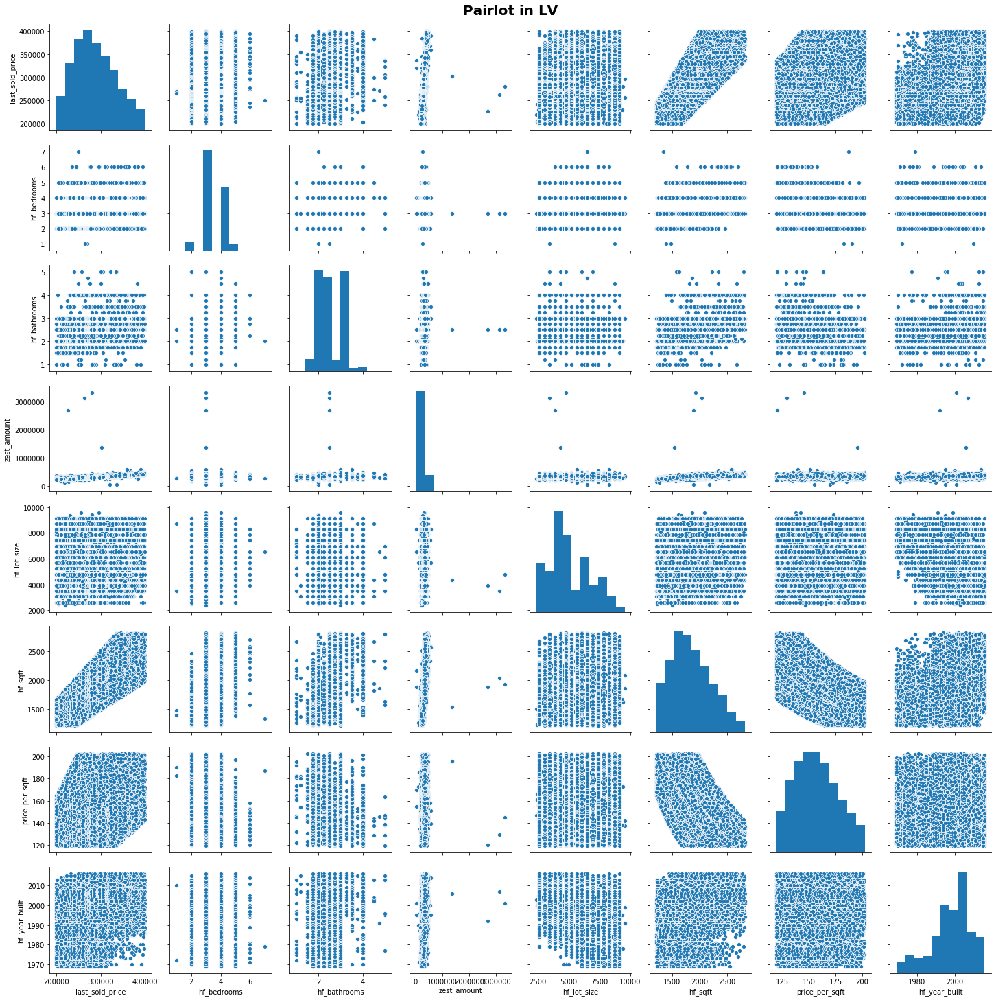

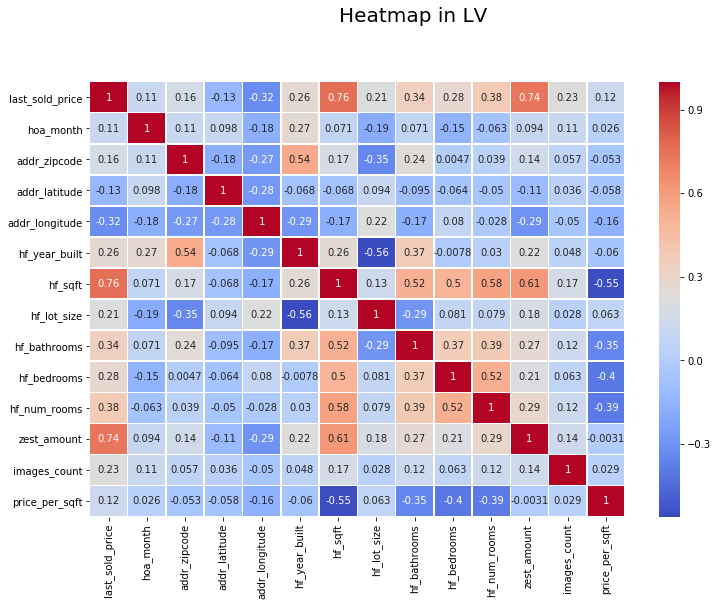

In [12]:

sns_plot = sns.pairplot(house_df_c0,
            vars = ['last_sold_price', 'hf_bedrooms','hf_bathrooms','zest_amount','hf_lot_size','hf_sqft','price_per_sqft','hf_year_built'])
sns_plot.fig.suptitle("Pairlot in LV", y=1.01, fontweight="bold", size=20 )

sns_plot.savefig("./images/pairlot_lv.png")


plt.figure(figsize=(12,8))
heatmap = sns.heatmap(house_df_c0.corr(),annot=True,linewidth = 0.5, cmap='coolwarm')

fig = heatmap.get_figure()
fig.suptitle("Heatmap in LV", y=1.01,  size=20 )
fig.savefig("./images/heatmap_lv.png")


<b>Showing correlation and heatmap for some neighborhoods in LV

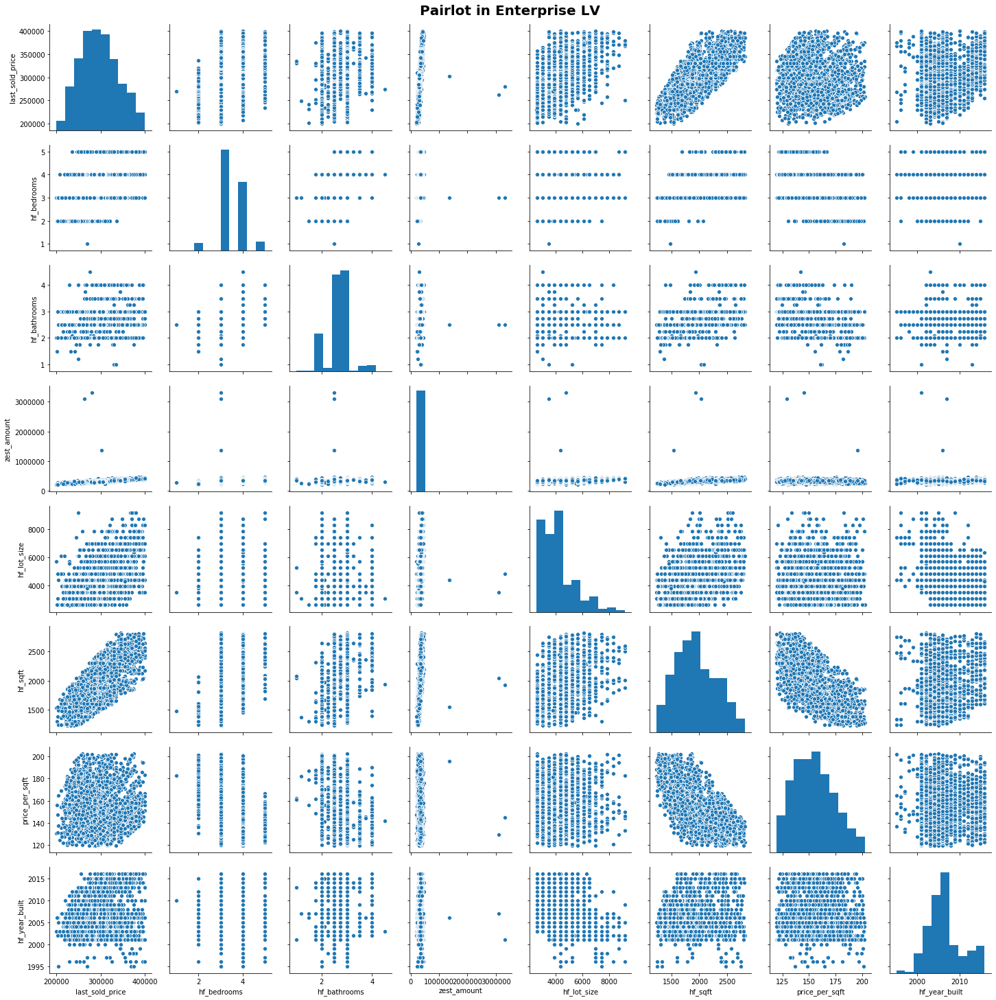

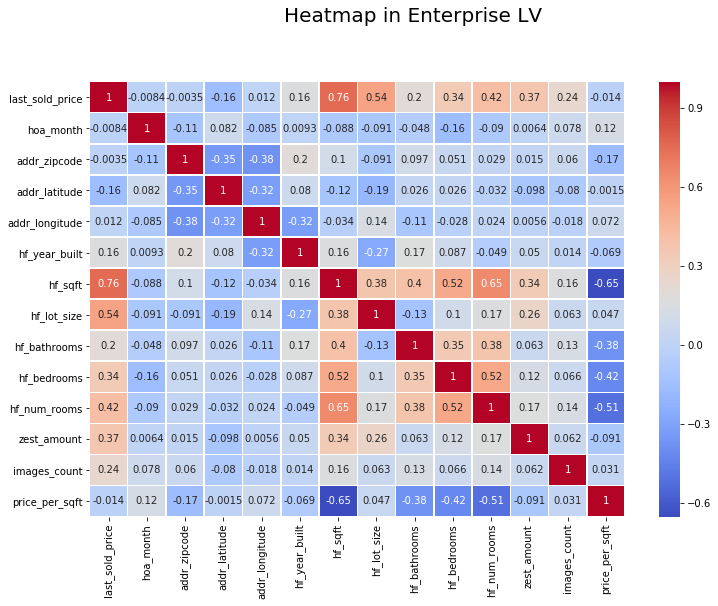

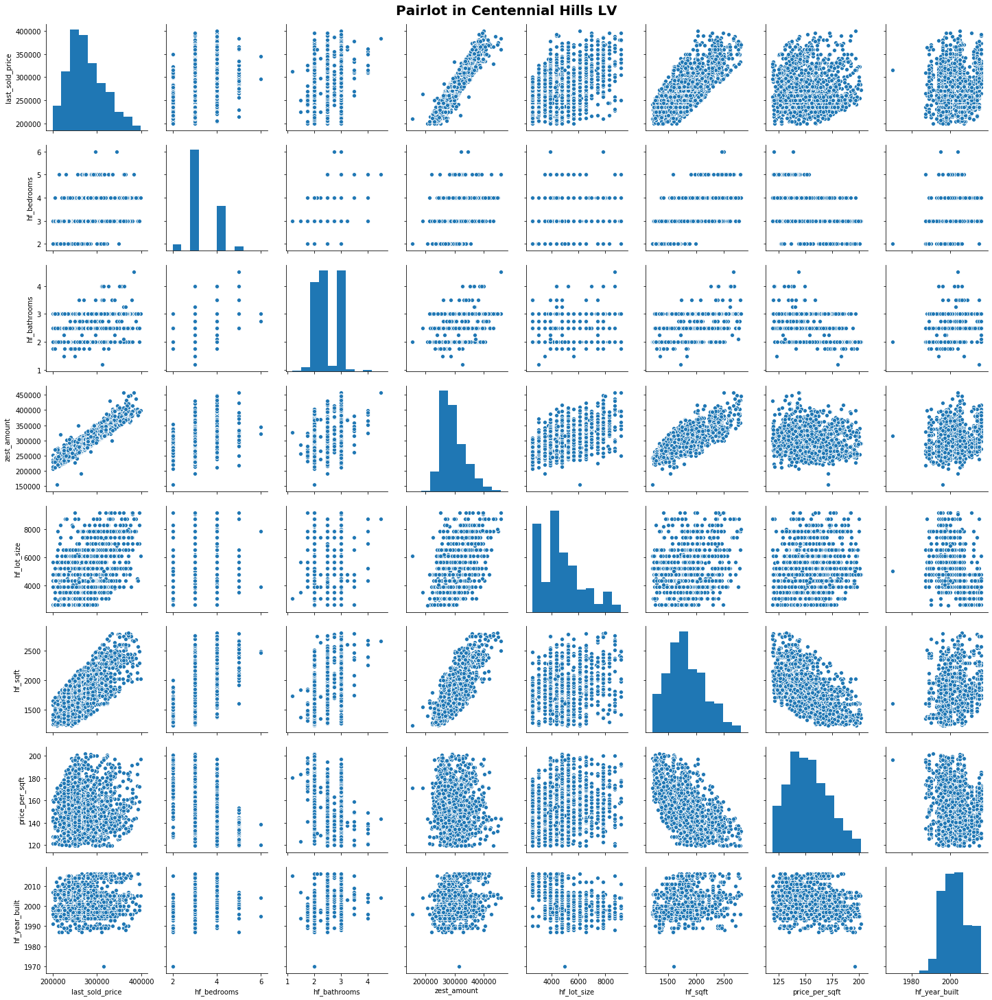

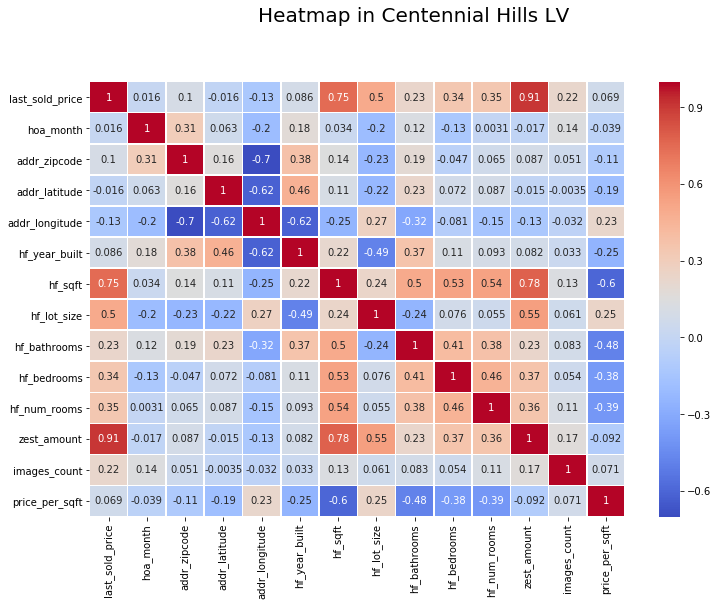

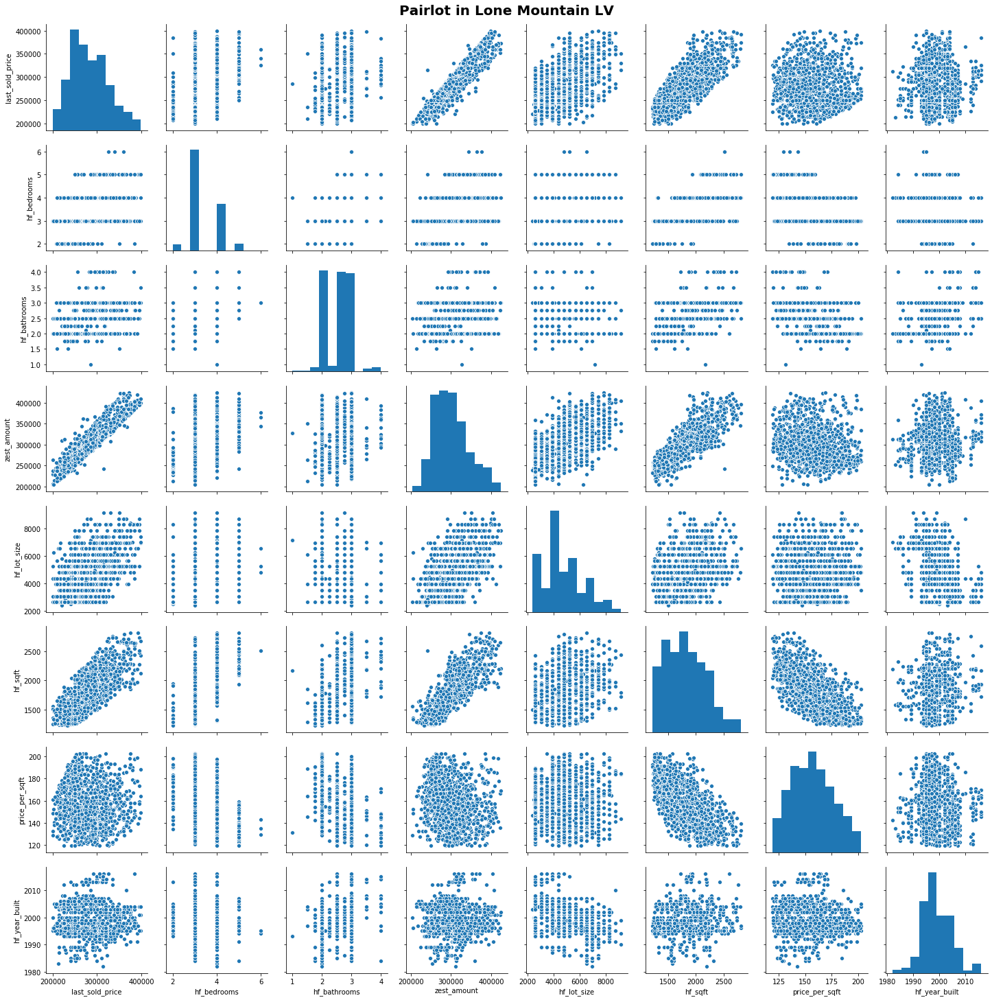

...

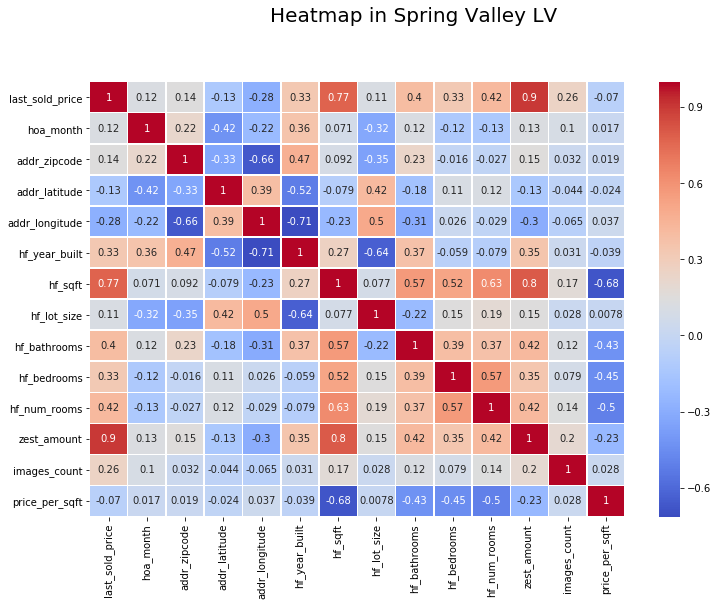

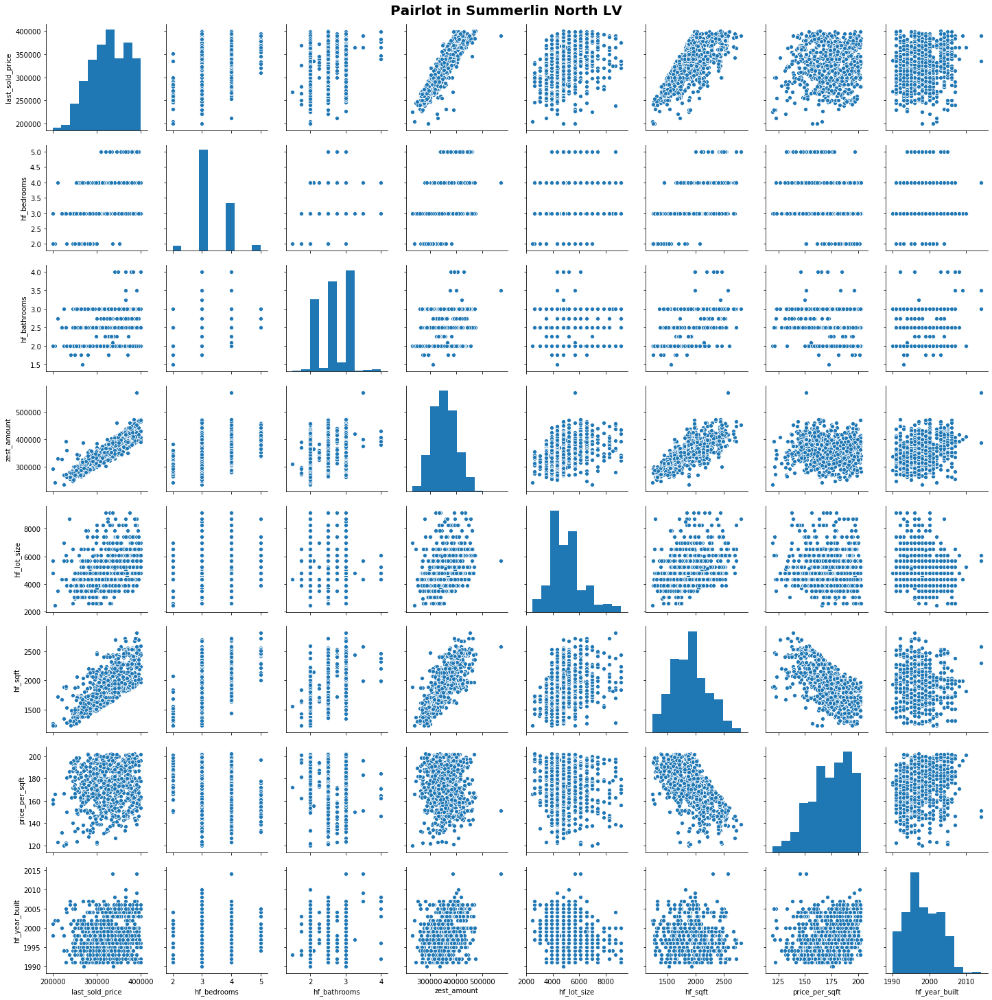

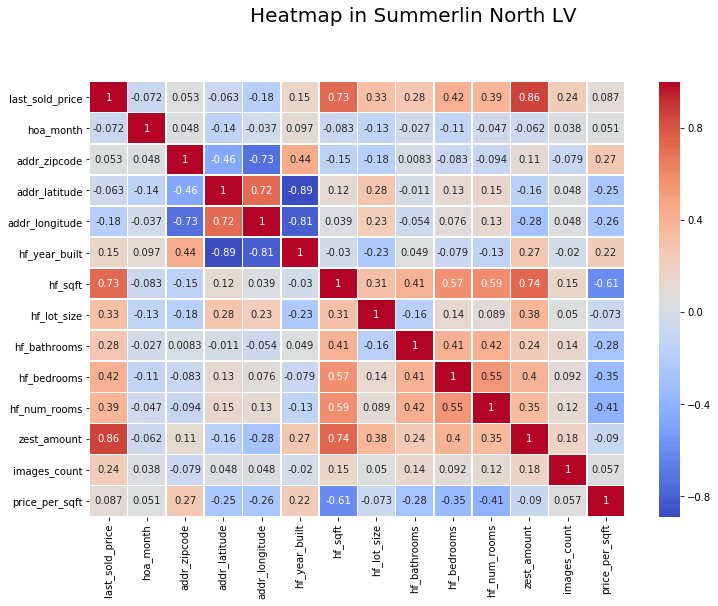

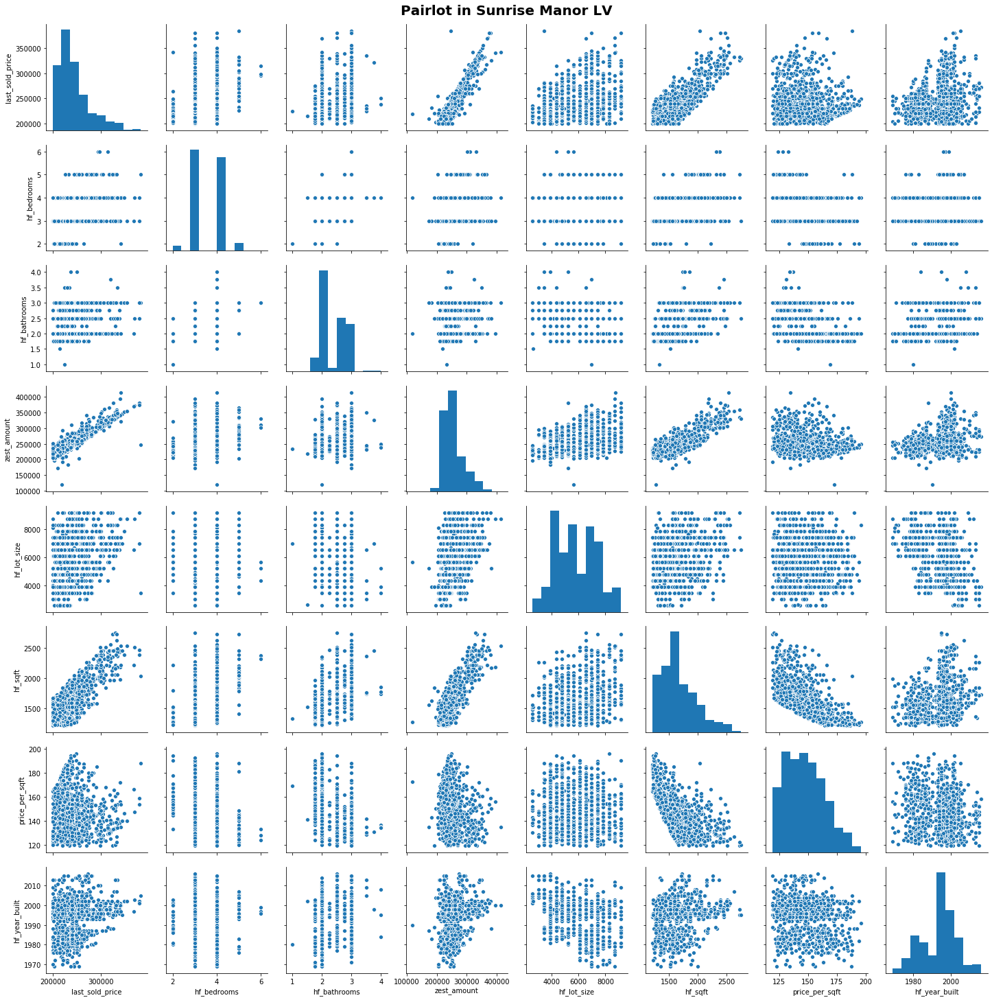

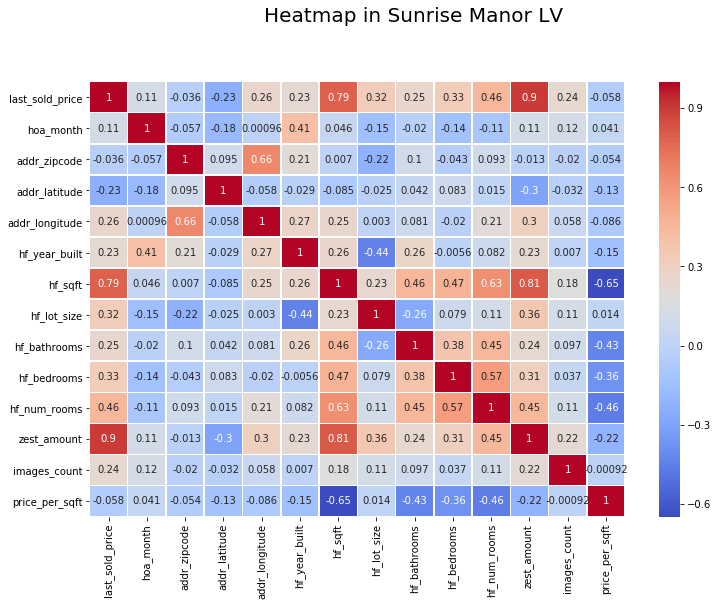

In [13]:
def generate_chart(region_name):
    house_df_region= house_df_c0[house_df_c0['region_name'].isin([region_name])]

    sns_plot = sns.pairplot(house_df_region,
                vars = ['last_sold_price', 'hf_bedrooms','hf_bathrooms','zest_amount','hf_lot_size','hf_sqft','price_per_sqft','hf_year_built'])
    sns_plot.fig.suptitle("Pairlot in " + region_name + " LV", y=1.01, fontweight="bold", size=20 )
    sns_plot.savefig("./images/pairlot_lv_"+ region_name + ".png")

    plt.figure(figsize=(12,8))
    heatmap = sns.heatmap(house_df_region.corr(),annot=True,linewidth = 0.5, cmap='coolwarm')

    fig = heatmap.get_figure()
    fig.suptitle("Heatmap in " + region_name + " LV", y=1.01,  size=20 )
    fig.savefig("./images/heatmap_lv_"+ region_name + ".png")
    
for name in ["Enterprise","Centennial Hills","Lone Mountain","North Cheyenne","Paradise",
              "Providence","Rancho Charleston","Spring Valley","Summerlin North",
              "Sunrise Manor"]:
    generate_chart(name)

In [14]:
import plotly.graph_objects as go

import numpy as np

x = np.random.randn(500)

fig = go.Figure(data=[go.Histogram(
        x=house_df['last_sold_price'], 
        xbins=dict(
            start=200000,
            end=400000,
            size=10000
            ),
        
        marker_color='#EB89B5',
        marker_line_color='#330C73',
        marker_line_width=1
      )])
fig.update_layout(
    title_text='Last Sold Price LV Histogram',
    xaxis_title_text='Price', # xaxis label
    yaxis_title_text='Count', # yaxis label
    bargap=0.2, # gap between bars of adjacent location coordinates
    bargroupgap=0.1 # gap between bars of the same location coordinates
)
fig.show()

mu = 287,524.10 and sigma = 52,793.90


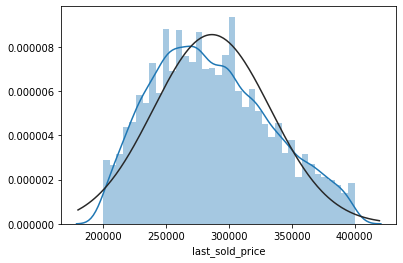

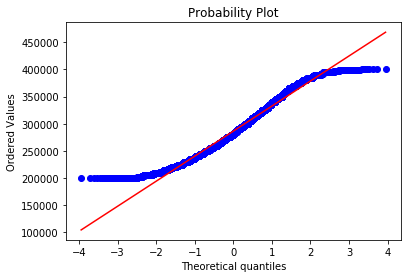

transformed mu = 12.55 and transformed sigma = 0.16


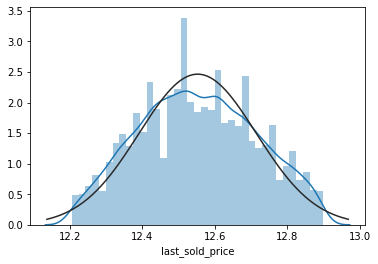

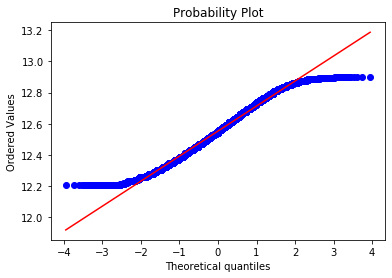

1     12.460715
6     12.264342
12    12.382125
13    12.239599
14    12.388394
15    12.506177
17    12.559894
18    12.495004
19    12.611538
20    12.447056
Name: last_sold_price, dtype: float64

In [15]:
y = house_df_c0.last_sold_price

sns.distplot(house_df_c0['last_sold_price'], fit = norm)
(mu, sigma) = norm.fit(house_df['last_sold_price'])
print('mu = {:,.2f} and sigma = {:,.2f}'.format(mu, sigma))

fig = plt.figure()
res = stats.probplot(house_df_c0['last_sold_price'], plot=plt)
plt.show()

# Apply Log transform to last_sold_price (y in training data)
y = np.log(y)

sns.distplot(y, fit = norm)
(mu, sigma) = norm.fit(y)
print('transformed mu = {:,.2f} and transformed sigma = {:,.2f}'.format(mu, sigma))

fig = plt.figure()
res = stats.probplot(y, plot=plt)
plt.show()

y.head(10)

<b>Training Model wtih XGBoost

In [16]:
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import Imputer
from xgboost import XGBRegressor

In [17]:
X = house_df_c0.copy()

low_cardinality_cols = [cname for cname in X.columns if 
                                X[cname].dtype == "object"] 
numeric_cols = [cname for cname in X.columns if 
                                X[cname].dtype in ['int64', 'float64']] 

one_hot_train_predictors = pd.get_dummies(X[low_cardinality_cols])

whole_data = pd.concat([X[numeric_cols], one_hot_train_predictors], axis=1)

whole_data = whole_data.drop(['last_sold_price','price_per_sqft','zest_amount'],
                          axis=1)

X_train_val, X_test, y_train_val, y_test = train_test_split(whole_data, y, test_size=0.2, random_state=1)

X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.2, random_state=1)



In [18]:
# Initial Pass:
my_XGB_model = XGBRegressor()
my_XGB_model.fit(X_train, y_train, verbose=False)

# make predictions
XGB_predictions = my_XGB_model.predict(X_val)
XGB_predictions = np.exp(XGB_predictions)
# Print MAE for initial XGB model
XGB_mae = mean_absolute_error(XGB_predictions, np.exp(y_val))
print("Validation MAE for XGBoost Model : " + str(XGB_mae))
      
# Additional Passes
my_XGB_model = XGBRegressor(n_estimators=2000, learning_rate=0.05)
my_XGB_model.fit(X_train, y_train, early_stopping_rounds=5, 
             eval_set=[(X_val, y_val)], verbose=True)
XGB_predictions = my_XGB_model.predict(X_val)
XGB_predictions = np.exp(XGB_predictions)
XGB_mult_mae = mean_absolute_error(XGB_predictions, np.exp(y_val))
print("Validation MAE for multi-pass XGBoost Model : " + str(XGB_mult_mae))

# Predict SalePrice on Test Data:
final_predictions = my_XGB_model.predict(X_test)
final_predictions = np.exp(final_predictions)
XGB_mae_final = mean_absolute_error(final_predictions, np.exp(y_test))
print('\n\n ---------------------------------------- \n\n')
print(final_predictions)
print(np.exp(y_test))
print("Finale Validation MAE for multi-pass XGBoost Model : " + str(XGB_mae_final))

/home/myao/anaconda3/envs/conda_ven_3.7/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version



[17:57:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Validation MAE for XGBoost Model : 17482.699484547564


/home/myao/anaconda3/envs/conda_ven_3.7/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version



[17:57:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:11.4501
Will train until validation_0-rmse hasn't improved in 5 rounds.
[1]	validation_0-rmse:10.8777
[2]	validation_0-rmse:10.334
[3]	validation_0-rmse:9.8175
[4]	validation_0-rmse:9.3268
[5]	validation_0-rmse:8.86065
[6]	validation_0-rmse:8.41778
[7]	validation_0-rmse:7.99706
[8]	validation_0-rmse:7.5973
[9]	validation_0-rmse:7.21761
[10]	validation_0-rmse:6.85689
[11]	validation_0-rmse:6.51415
[12]	validation_0-rmse:6.18863
[13]	validation_0-rmse:5.87931
[14]	validation_0-rmse:5.58554
[15]	validation_0-rmse:5.30641
[16]	validation_0-rmse:5.04129
[17]	validation_0-rmse:4.78942
[18]	validation_0-rmse:4.5501
[19]	validation_0-rmse:4.32278
[20]	validation_0-rmse:4.10682
[21]	validation_0-rmse:3.90168
[22]	validation_0-rmse:3.70679
[23]	validation_0-rmse:3.52169
[24]	validation_0-rmse:3.34581
[25]	validation_0-rmse:3.1787
[26]	validation_0-r

[249]	validation_0-rmse:0.076194
[250]	validation_0-rmse:0.076184
[251]	validation_0-rmse:0.076168
[252]	validation_0-rmse:0.076155
[253]	validation_0-rmse:0.076138
[254]	validation_0-rmse:0.07612
[255]	validation_0-rmse:0.076107
[256]	validation_0-rmse:0.076086
[257]	validation_0-rmse:0.076071
[258]	validation_0-rmse:0.076056
[259]	validation_0-rmse:0.07605
[260]	validation_0-rmse:0.076036
[261]	validation_0-rmse:0.076013
[262]	validation_0-rmse:0.076013
[263]	validation_0-rmse:0.076012
[264]	validation_0-rmse:0.075994
[265]	validation_0-rmse:0.075976
[266]	validation_0-rmse:0.075972
[267]	validation_0-rmse:0.075954
[268]	validation_0-rmse:0.075947
[269]	validation_0-rmse:0.075931
[270]	validation_0-rmse:0.075924
[271]	validation_0-rmse:0.075914
[272]	validation_0-rmse:0.075913
[273]	validation_0-rmse:0.075905
[274]	validation_0-rmse:0.075898
[275]	validation_0-rmse:0.075886
[276]	validation_0-rmse:0.075867
[277]	validation_0-rmse:0.075854
[278]	validation_0-rmse:0.075841
[279]	valida

[499]	validation_0-rmse:0.074914
Stopping. Best iteration:
[494]	validation_0-rmse:0.07491

Validation MAE for multi-pass XGBoost Model : 16933.77567799252


 ---------------------------------------- 


[300065.88 264739.53 343892.72 ... 304711.   212690.92 339896.28]
22126    258000.0
8454     286000.0
14882    369900.0
22227    203000.0
17613    226000.0
           ...   
12454    329000.0
24595    233000.0
24280    335000.0
4604     225000.0
25337    345000.0
Name: last_sold_price, Length: 3509, dtype: float64
Finale Validation MAE for multi-pass XGBoost Model : 16986.804110857793


Validation MAE for multi-pass XGBoost Model : 16933.77567799252


 ---------------------------------------- 


[300065.88 264739.53 343892.72 ... 304711.   212690.92 339896.28]
22126    258000.0
8454     286000.0
14882    369900.0
22227    203000.0
17613    226000.0
           ...   
12454    329000.0
24595    233000.0
24280    335000.0
4604     225000.0
25337    345000.0
Name: last_sold_price, Length: 3509, dtype: float64
Finale Validation MAE for multi-pass XGBoost Model : 16986.804110857793


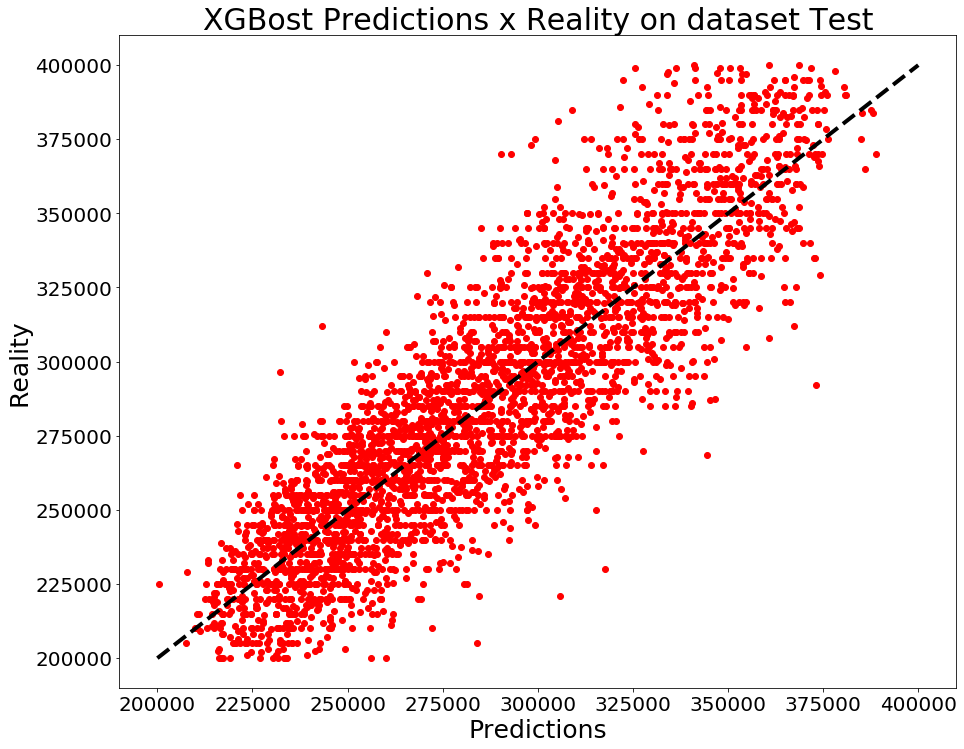

In [19]:
import matplotlib.pyplot as plt
import matplotlib
import itertools
import pickle



XGB_predictions = my_XGB_model.predict(X_val)
XGB_predictions = np.exp(XGB_predictions)
XGB_mult_mae = mean_absolute_error(XGB_predictions, np.exp(y_val))
print("Validation MAE for multi-pass XGBoost Model : " + str(XGB_mult_mae))

# Predict SalePrice on Test Data:
final_predictions = my_XGB_model.predict(X_test)
final_predictions = np.exp(final_predictions)
XGB_mae_final = mean_absolute_error(final_predictions, np.exp(y_test))
print('\n\n ---------------------------------------- \n\n')
print(final_predictions)
print(np.exp(y_test))
print("Finale Validation MAE for multi-pass XGBoost Model : " + str(XGB_mae_final))


# make predictions for test data
#y_pred = loaded_model.predict(X_test)

matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20)
fig, ax = plt.subplots(figsize=(15, 12))
plt.style.use('ggplot')
plt.plot(final_predictions, np.exp(y_test), 'ro')
plt.xlabel('Predictions', fontsize = 25)
plt.ylabel('Reality', fontsize = 25)
plt.title('XGBost Predictions x Reality on dataset Test', fontsize = 30)
ax.plot([np.exp(y_test).min(), np.exp(y_test).max()], [np.exp(y_test).min(), np.exp(y_test).max()], 'k--', lw=4)
plt.savefig('images/XGBost Predictions x Reality on dataset Test.png', format='png')
plt.show()


In [20]:
#if we need run zest, we need remove the zest_amount from the drop list.
#XGB_mar_zest = mean_absolute_error(X_test['zest_amount'], np.exp(y_test))
#print("zest Validation MAE for multi-pass XGBoost Model : " + str(XGB_mar_zest))

In [21]:
'''
import matplotlib.pyplot as plt
import matplotlib
import itertools

matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20)
fig, ax = plt.subplots(figsize=(15, 12))
plt.style.use('ggplot')
plt.plot(final_predictions['zest_amount'], np.exp(y_test), 'bo')
plt.xlabel('Zest', fontsize = 25)
plt.ylabel('Reality', fontsize = 25)
plt.title('Zest x Reality on dataset Test', fontsize = 30)
ax.plot([np.exp(y_test).min(), np.exp(y_test).max()], [np.exp(y_test).min(), np.exp(y_test).max()], 'k--', lw=4, )
plt.savefig('images/Z-Estimation Predictions x Reality on dataset Test.png', format='png')
plt.show()
'''

"\nimport matplotlib.pyplot as plt\nimport matplotlib\nimport itertools\n\nmatplotlib.rc('xtick', labelsize=20) \nmatplotlib.rc('ytick', labelsize=20)\nfig, ax = plt.subplots(figsize=(15, 12))\nplt.style.use('ggplot')\nplt.plot(final_predictions['zest_amount'], np.exp(y_test), 'bo')\nplt.xlabel('Zest', fontsize = 25)\nplt.ylabel('Reality', fontsize = 25)\nplt.title('Zest x Reality on dataset Test', fontsize = 30)\nax.plot([np.exp(y_test).min(), np.exp(y_test).max()], [np.exp(y_test).min(), np.exp(y_test).max()], 'k--', lw=4, )\nplt.savefig('images/Z-Estimation Predictions x Reality on dataset Test.png', format='png')\nplt.show()\n"

<b> Random Forest Model

In [22]:
features = pd.concat([X_train, X_val, X_test])
labels = pd.concat([y_train,y_val, y_test])
features.shape

(17543, 1199)

In [23]:
# One-hot encode categorical features
features = pd.get_dummies(features)
features.head(5)

,hoa_month,addr_zipcode,addr_latitude,addr_longitude,hf_year_built,hf_sqft,hf_lot_size,hf_bathrooms,hf_bedrooms,hf_num_rooms,...,sch_high_West Prep,sch_high_Western,sch_high_Western HS,sch_high_White Pine High School,sch_high_centennial,sch_high_cimarron,sch_high_durango,sch_high_las vegas high,sch_high_silverado,sch_high_silverado high
3530,111.0,89166,36.300448,-115.326330,2013.0,2036.0,3920.0,3.0,3.0,6.0,...,0,0,0,0,0,0,0,0,0,0
21655,62.0,89131,36.303611,-115.268266,2001.0,2421.0,5662.0,2.0,3.0,7.0,...,0,0,0,0,0,0,0,0,0,0
23451,22.0,89183,36.009357,-115.153589,1999.0,1461.0,4791.0,2.0,3.0,6.0,...,0,0,0,0,0,0,0,0,0,0
27124,0.0,89183,35.979374,-115.166514,2005.0,2297.0,3484.0,2.5,4.0,7.0,...,0,0,0,0,0,0,0,0,0,0
20754,14.0,89139,36.036591,-115.242130,2009.0,1887.0,3920.0,2.0,3.0,7.0,...,0,0,0,0,0,0,0,0,0,0


In [24]:
# Use numpy to convert to arrays
import numpy as np

# Labels are the values we want to predict
labels = np.array(labels)

# Saving feature names for later use
feature_list = list(features.columns)

# Convert to numpy array
features = np.array(features)

In [25]:
# Using Skicit-learn to split data into training and testing sets
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
train_features, test_features, train_labels, test_labels = train_test_split(features, labels, test_size = 0.25,
                                                                           random_state = 42)

In [26]:
# Import the model we are using
from sklearn.ensemble import RandomForestRegressor

# Instantiate model 
rf = RandomForestRegressor(n_estimators= 1000, random_state=42)
#rf = RandomForestRegressor(n_estimators = 100, criterion = 'mse', max_depth = None, min_samples_split = 2, min_samples_leaf = 1)
# Train the model on training data
rf.fit(X_train, y_train);

In [27]:
import numpy as np

# Use the forest's predict method on the test data
predictions = rf.predict(X_test)

# Calculate the absolute errors
errors = abs(predictions - y_test)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), '.')

rf_mae = mean_absolute_error(np.exp(predictions), np.exp(y_test))
print("Validation MAE for Random Forest Model : " + str(rf_mae))

Mean Absolute Error: 0.06 .
Validation MAE for Random Forest Model : 17084.024456933166


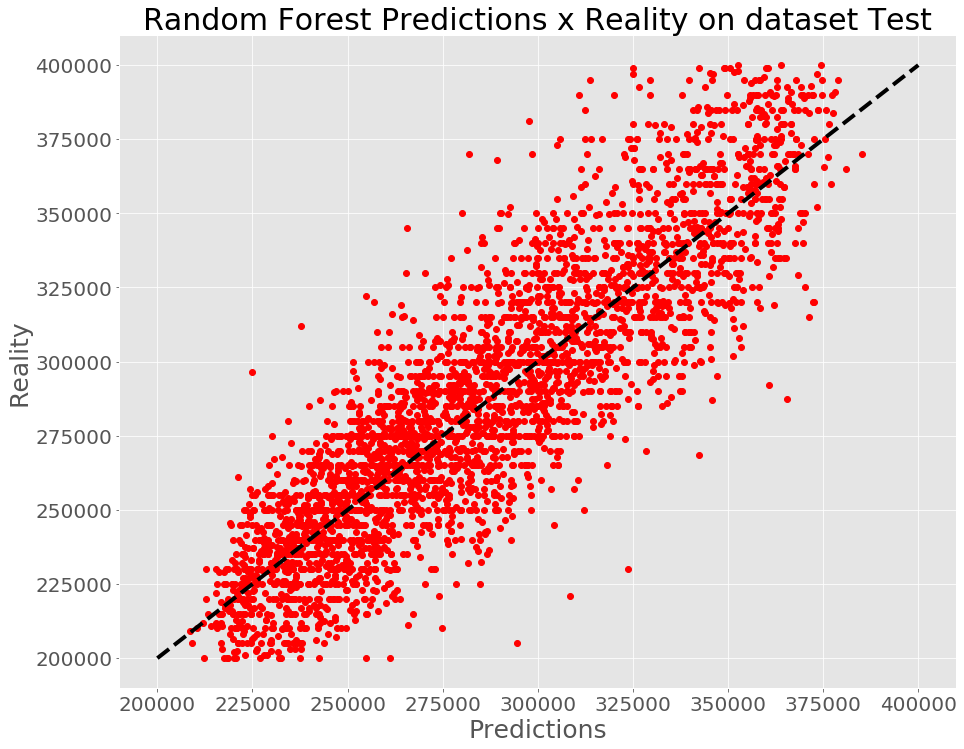

In [28]:
import matplotlib.pyplot as plt
import matplotlib
import itertools
import pickle

matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20)
fig, ax = plt.subplots(figsize=(15, 12))
plt.style.use('ggplot')
plt.plot(np.exp(predictions), np.exp(y_test), 'ro')
plt.xlabel('Predictions', fontsize = 25)
plt.ylabel('Reality', fontsize = 25)
plt.title('Random Forest Predictions x Reality on dataset Test', fontsize = 30)
ax.plot([np.exp(y_test).min(), np.exp(y_test).max()], [np.exp(y_test).min(), np.exp(y_test).max()], 'k--', lw=4)
plt.savefig('images/Random Forest Predictions x Reality on dataset Test wo zest.png', format='png')
plt.show()

In [29]:
# Get numerical feature importances
importances = list(rf.feature_importances_)

# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_list, importances)]

# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)

# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: hf_sqft              Importance: 0.6
Variable: addr_longitude       Importance: 0.08
Variable: addr_latitude        Importance: 0.04
Variable: hf_lot_size          Importance: 0.04
Variable: hf_year_built        Importance: 0.03
Variable: images_count         Importance: 0.03
Variable: sch_high_Palo Verde  Importance: 0.02
Variable: hoa_month            Importance: 0.01
Variable: addr_zipcode         Importance: 0.01
Variable: hf_bathrooms         Importance: 0.01
Variable: hf_num_rooms         Importance: 0.01
Variable: hf_bedrooms          Importance: 0.0
Variable: house_fact.appliances_microwave_No Importance: 0.0
Variable: house_fact.appliances_microwave_Yes Importance: 0.0
Variable: house_fact.appliances_refrigerator_No Importance: 0.0
Variable: house_fact.appliances_refrigerator_Yes Importance: 0.0
Variable: house_fact.appliances_dishwasher_No Importance: 0.0
Variable: house_fact.appliances_dishwasher_Yes Importance: 0.0
Variable: house_fact.appliances_dryer_No Importan

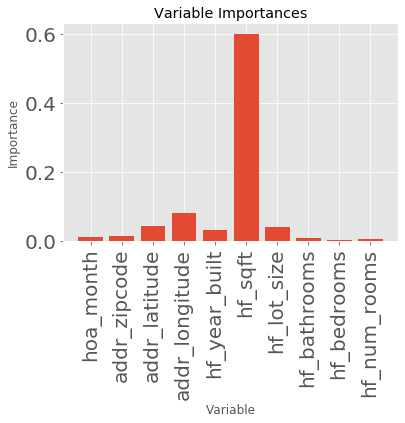

In [30]:
# list of x locations for plotting
x_values = list(range(10))

# Make a bar chart
plt.bar(x_values, importances[:10], orientation = 'vertical')

# Tick labels for x axis
plt.xticks(x_values, feature_list, rotation='vertical')

# Axis labels and title
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

<b> Support Vector Regression

In [31]:
from sklearn.svm import SVR
from sklearn.metrics import r2_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [32]:
svrmodel=SVR(kernel='linear',degree=1)

In [33]:
house_train = house_df_c0.copy()
house_train.index = range(0,len(house_train))
whole_data = house_train.drop(['price_per_sqft','zest_amount'],
                          axis=1)
whole_data['last_sold_price'] = np.log(whole_data['last_sold_price'])
train_numerical = whole_data.select_dtypes(exclude=['object'])
train_categoric = whole_data.select_dtypes(include=['object'])
           
house_train_all = train_numerical.merge(train_categoric, left_index = True, right_index = True)
house_train_all.index = range(0,len(house_train_all))


In [34]:
print(house_train_all.shape)


(17543, 97)


In [35]:
number_row = len(house_train_all)
print(number_row)
col_train_num = list(train_numerical.columns)
col_train_num_bis = list(train_numerical.columns)
col_train_cat = list(train_categoric.columns)
col_train_num_bis.remove('last_sold_price')
mat_train = np.matrix(train_numerical)
mat_new = np.matrix(train_numerical.drop('last_sold_price',axis = 1))
mat_y = np.array(house_train.last_sold_price)

prepro_y = MinMaxScaler()
prepro_y.fit(mat_y.reshape(number_row,1))
#print(mat_y.shape)
prepro = MinMaxScaler()
prepro.fit(mat_train)
prepro_test = MinMaxScaler()
prepro_test.fit(mat_new)
train_num_scale = pd.DataFrame(prepro.transform(mat_train),columns = col_train_num)
house_train[col_train_num] = pd.DataFrame(prepro.transform(mat_train),columns = col_train_num)

17543


In [36]:
house_train.isnull().sum(axis = 0)

last_sold_price                                  0
house_fact.appliances_microwave                  0
house_fact.appliances_refrigerator               0
house_fact.appliances_dishwasher                 0
house_fact.appliances_dryer                      0
house_fact.appliances_freezer                    0
house_fact.appliances_garbage_disposal           0
house_fact.appliances_range_oven                 0
house_fact.appliances_washer                     0
house_fact.appliances_trash_compactor            0
house_fact.architecture_ranch_rambler            0
house_fact.architecture_other                    0
house_fact.architecture_contemporary             0
house_fact.architecture_modern                   0
house_fact.architecture_cape_cod                 0
house_fact.architecture_spanish                  0
house_fact.architecture_santa_fe_pueblo_style    0
house_fact.architecture_bungalow                 0
house_fact.architecture_loft                     0
house_fact.architecture_split_l

In [37]:
whole_y = prepro_y.transform(mat_y.reshape(number_row,1)).reshape(number_row)

X = house_train.copy()
low_cardinality_cols = [cname for cname in X.columns if #X_val[cname].nunique() < 90 and
                                X[cname].dtype == "object"] # eligible to be one-hot encoded if it is type object and <10 unique values
numeric_cols = [cname for cname in house_train.columns if 
                                X[cname].dtype in ['int64', 'float64']] # numerical data if integer or float

one_hot_train_predictors = pd.get_dummies(X[low_cardinality_cols])

whole_data = pd.concat([X[numeric_cols], one_hot_train_predictors], axis=1)

whole_data = whole_data.drop(['last_sold_price'],
                          axis=1)

X_train_val, X_test, y_train_val, y_test = train_test_split(whole_data, whole_y, test_size=0.2, random_state=1)

X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.2, random_state=1)
    


In [ ]:
svrmodel.fit(X_train,y_train)

In [ ]:
predictions = svrmodel.predict(X_test)

# Calculate the absolute errors
errors = abs(predictions - y_test)
count_test = len(X_test)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'dollars.')

pred = pd.DataFrame(prepro_y.inverse_transform(np.array(predictions).reshape(count_test,1)))
pred = np.exp(pred)
print(pred)
reality = pd.DataFrame(prepro_y.inverse_transform(np.array(y_test).reshape(count_test,1)))
reality = np.exp(reality)

In [ ]:
from sklearn.metrics import mean_absolute_error
rf_mae = mean_absolute_error(pred, reality)
print("Validation MAE for SVR Model : " + str(rf_mae))

In [ ]:
matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20)
fig, ax = plt.subplots(figsize=(15, 12))
plt.style.use('ggplot')
plt.plot(pred.values, reality.values, 'ro')
plt.xlabel('Predictions', fontsize = 25)
plt.ylabel('Reality', fontsize = 25)
plt.title('SVR Predictions x Reality on dataset Test', fontsize = 30)
ax.plot([reality.min(), reality.max()], [reality.min(), reality.max()], 'k--', lw=4)
plt.savefig('images/las_vegas_24_mo_sold_sfh_svr_wo_zest.png')
plt.show()